<a href="https://colab.research.google.com/github/JASCRAJ/Sketch-literature/blob/main/210324.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

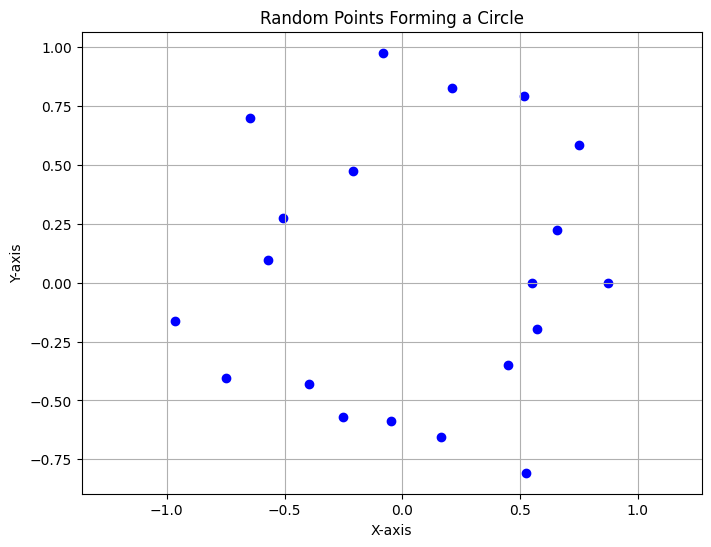

In [3]:
import matplotlib.pyplot as plt
import numpy as np

# Generate 20 random points in 2D plane forming a circle
num_points = 20
theta = np.linspace(0, 2*np.pi, num_points)
radius = np.random.uniform(0.5, 1.0, size=num_points)
x = radius * np.cos(theta)
y = radius * np.sin(theta)

# Plot the points
plt.figure(figsize=(8, 6))
plt.scatter(x, y, color='blue')
plt.title('Random Points Forming a Circle')
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.axis('equal')  # Ensure aspect ratio is equal
plt.grid(True)
plt.show()


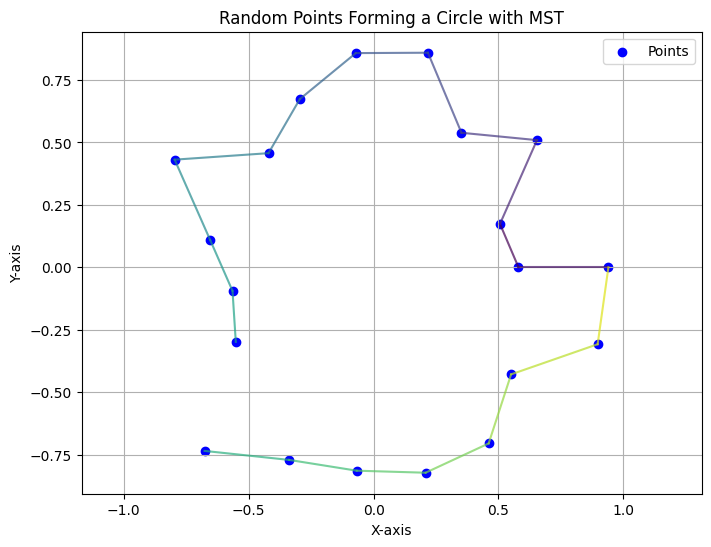

In [4]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.spatial import distance
from scipy.sparse import csr_matrix
from scipy.sparse.csgraph import minimum_spanning_tree

# Generate 20 random points in 2D plane forming a circle
num_points = 20
theta = np.linspace(0, 2*np.pi, num_points)
radius = np.random.uniform(0.5, 1.0, size=num_points)
x = radius * np.cos(theta)
y = radius * np.sin(theta)

# Calculate pairwise distances between points
points = np.column_stack((x, y))
distances = distance.cdist(points, points)

# Compute minimum spanning tree
graph = csr_matrix(distances)
mst = minimum_spanning_tree(graph)

# Extract edges from MST
edges = []
for i in range(num_points):
    for j in range(i + 1, num_points):
        if mst[i, j] != 0:
            edges.append((i, j))

# Plot the points
plt.figure(figsize=(8, 6))
plt.scatter(x, y, color='blue', label='Points')
plt.title('Random Points Forming a Circle with MST')
plt.xlabel('X-axis')
plt.ylabel('Y-axis')

# Plot MST edges with different colors
for i, (start, end) in enumerate(edges):
    plt.plot([x[start], x[end]], [y[start], y[end]], color=plt.cm.viridis(i / len(edges)), alpha=0.7)

plt.axis('equal')  # Ensure aspect ratio is equal
plt.grid(True)
plt.legend()
plt.show()


/usr/local/lib/python3.10/dist-packages/matplotlib/animation.py:884: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you output the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(


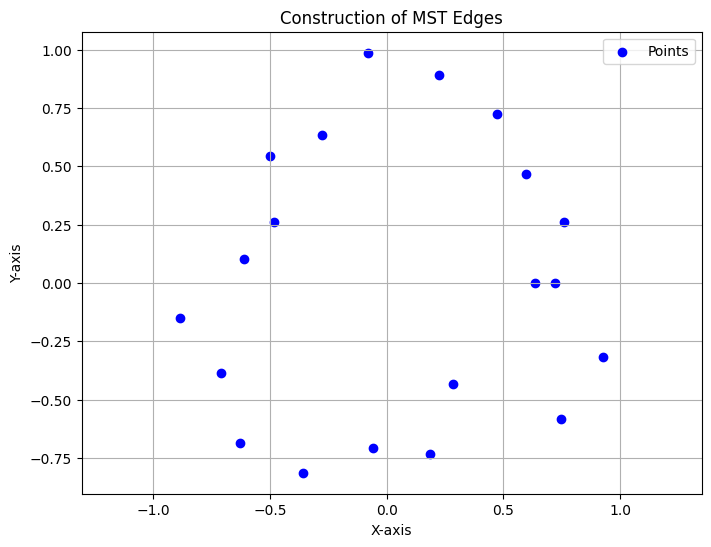

In [10]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.spatial import distance
from scipy.sparse import csr_matrix
from scipy.sparse.csgraph import minimum_spanning_tree
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Generate 20 random points in 2D plane forming a circle
num_points = 20
theta = np.linspace(0, 2*np.pi, num_points)
radius = np.random.uniform(0.5, 1.0, size=num_points)
x = radius * np.cos(theta)
y = radius * np.sin(theta)

# Calculate pairwise distances between points
points = np.column_stack((x, y))
distances = distance.cdist(points, points)

# Compute minimum spanning tree
graph = csr_matrix(distances)
mst = minimum_spanning_tree(graph)

# Extract edges from MST
edges = []
for i in range(num_points):
    for j in range(i + 1, num_points):
        if mst[i, j] != 0:
            edges.append((i, j))

# Sort edges by their weights
edges.sort(key=lambda edge: distances[edge[0], edge[1]])

# Create a function to animate the construction of edges
def animate(frame):
    plt.clf()
    plt.scatter(x, y, color='blue', label='Points')
    plt.title('Construction of MST Edges')
    plt.xlabel('X-axis')
    plt.ylabel('Y-axis')

    # Plot edges up to the current frame
    for i in range(frame):
        start, end = edges[i]
        plt.plot([x[start], x[end]], [y[start], y[end]], color='red')

    plt.axis('equal')
    plt.grid(True)
    plt.legend()

# Create animation
fig = plt.figure(figsize=(8, 6))
ani = FuncAnimation(fig, animate, frames=len(edges)+1, repeat=False)

# Display animation in Colab
HTML(ani.to_jshtml())


<ipython-input-11-a41050f98455>:27: RuntimeWarning: invalid value encountered in multiply
  next_city = np.argmin(distances[current] + np.array(visited) * np.inf)


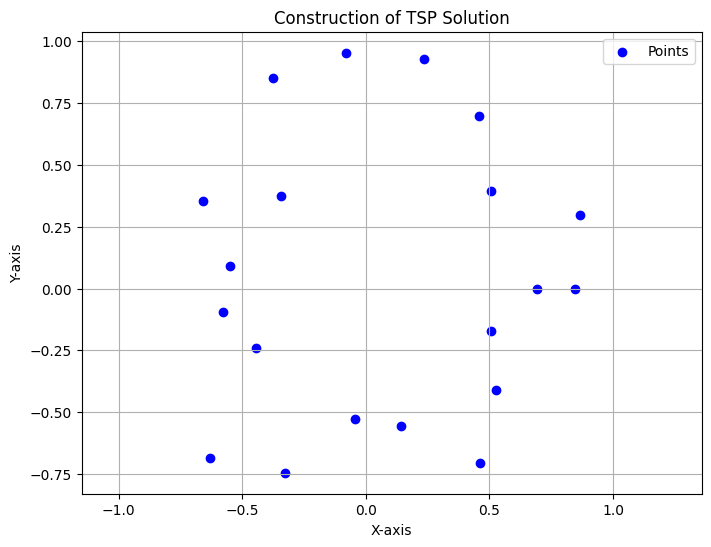

In [11]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.spatial import distance
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Generate 20 random points in 2D plane forming a circle
num_points = 20
theta = np.linspace(0, 2*np.pi, num_points)
radius = np.random.uniform(0.5, 1.0, size=num_points)
x = radius * np.cos(theta)
y = radius * np.sin(theta)

# Create distance matrix
points = np.column_stack((x, y))
distances = distance.cdist(points, points)

# Nearest neighbor algorithm for TSP
def nearest_neighbor(distances):
    n = len(distances)
    visited = [False] * n
    tour = []
    current = 0
    visited[current] = True
    tour.append(current)
    for _ in range(n - 1):
        next_city = np.argmin(distances[current] + np.array(visited) * np.inf)
        visited[next_city] = True
        tour.append(next_city)
        current = next_city
    return tour

# Create a function to animate the construction of the TSP solution
def animate(frame):
    plt.clf()
    plt.scatter(x, y, color='blue', label='Points')
    plt.title('Construction of TSP Solution')
    plt.xlabel('X-axis')
    plt.ylabel('Y-axis')

    # Plot the current tour up to the current frame
    for i in range(frame):
        start = tour[i]
        end = tour[i + 1] if i + 1 < len(tour) else tour[0]
        plt.plot([x[start], x[end]], [y[start], y[end]], color='red')

    plt.axis('equal')
    plt.grid(True)
    plt.legend()

# Nearest neighbor algorithm to find TSP solution
tour = nearest_neighbor(distances)

# Create animation
fig = plt.figure(figsize=(8, 6))
ani = FuncAnimation(fig, animate, frames=len(tour)-1, repeat=False)

# Display animation in Colab
HTML(ani.to_jshtml())


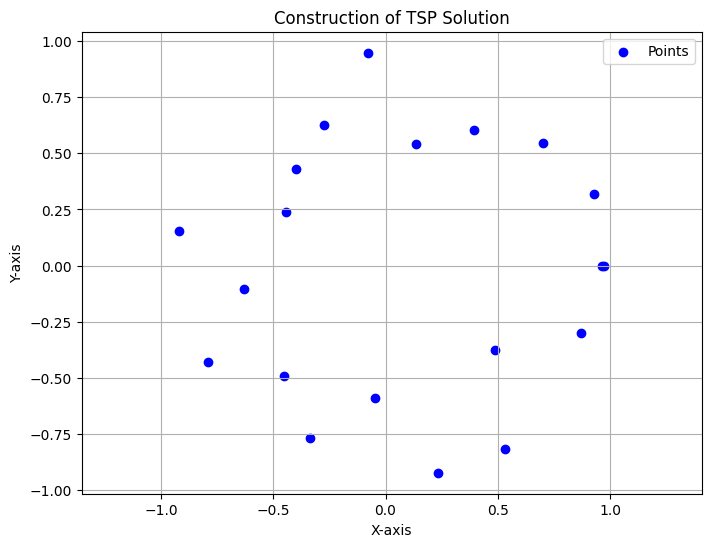

In [13]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.spatial import distance
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Generate 20 random points in 2D plane forming a circle
num_points = 20
theta = np.linspace(0, 2*np.pi, num_points)
radius = np.random.uniform(0.5, 1.0, size=num_points)
x = radius * np.cos(theta)
y = radius * np.sin(theta)

# Create distance matrix
points = np.column_stack((x, y))
distances = distance.cdist(points, points)

# Nearest neighbor algorithm for TSP
def nearest_neighbor(distances):
    n = len(distances)
    visited = [False] * n
    tour = []
    current = 0
    visited[current] = True
    tour.append(current)
    for _ in range(n - 1):
        next_city = np.argmin(distances[current] + np.array(visited) * 1e9)  # Use a large number instead of np.inf
        visited[next_city] = True
        tour.append(next_city)
        current = next_city
    # Connect back to the starting city to complete the tour
    tour.append(tour[0])
    return tour

# Create a function to animate the construction of the TSP solution
def animate(frame):
    plt.clf()
    plt.scatter(x, y, color='blue', label='Points')
    plt.title('Construction of TSP Solution')
    plt.xlabel('X-axis')
    plt.ylabel('Y-axis')

    # Plot the current tour up to the current frame
    for i in range(frame):
        start = tour[i]
        end = tour[i + 1]
        plt.plot([x[start], x[end]], [y[start], y[end]], color='red')

    plt.axis('equal')
    plt.grid(True)
    plt.legend()

# Nearest neighbor algorithm to find TSP solution
tour = nearest_neighbor(distances)

# Create animation
fig = plt.figure(figsize=(8, 6))
ani = FuncAnimation(fig, animate, frames=len(tour)-1, repeat=False)

# Display animation in Colab
HTML(ani.to_jshtml())


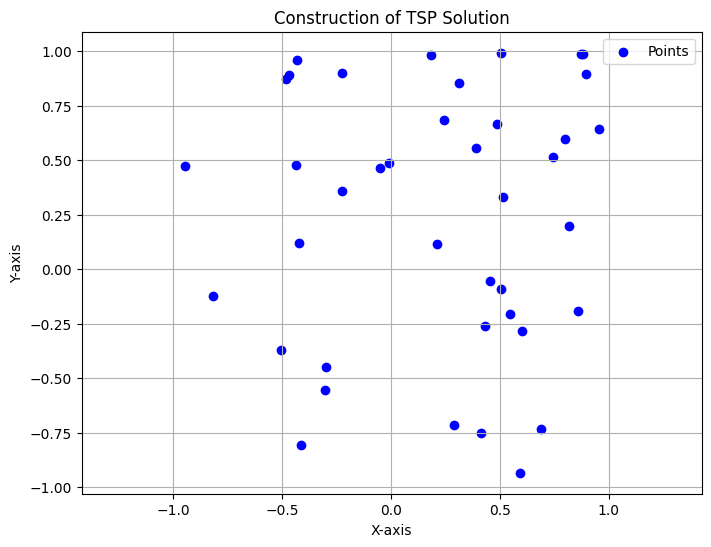

In [15]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Generate 20 random points in 2D plane
num_points = 40
x = np.random.uniform(-1, 1, size=num_points)
y = np.random.uniform(-1, 1, size=num_points)

# Create distance matrix
points = np.column_stack((x, y))
distances = np.linalg.norm(points[:, np.newaxis] - points, axis=2)

# Nearest neighbor algorithm for TSP
def nearest_neighbor(distances):
    n = len(distances)
    visited = [False] * n
    tour = []
    current = 0
    visited[current] = True
    tour.append(current)
    for _ in range(n - 1):
        next_city = np.argmin(distances[current] + np.array(visited) * 1e9)  # Use a large number instead of np.inf
        visited[next_city] = True
        tour.append(next_city)
        current = next_city
    # Connect back to the starting city to complete the tour
    tour.append(tour[0])
    return tour

# Create a function to animate the construction of the TSP solution
def animate(frame):
    plt.clf()
    plt.scatter(x, y, color='blue', label='Points')
    plt.title('Construction of TSP Solution')
    plt.xlabel('X-axis')
    plt.ylabel('Y-axis')

    # Plot the current tour up to the current frame
    for i in range(frame):
        start = tour[i]
        end = tour[i + 1]
        plt.plot([x[start], x[end]], [y[start], y[end]], color='red')

    plt.axis('equal')
    plt.grid(True)
    plt.legend()

# Nearest neighbor algorithm to find TSP solution
tour = nearest_neighbor(distances)

# Create animation
fig = plt.figure(figsize=(8, 6))
ani = FuncAnimation(fig, animate, frames=len(tour)-1, repeat=False)

# Display animation in Colab
HTML(ani.to_jshtml())


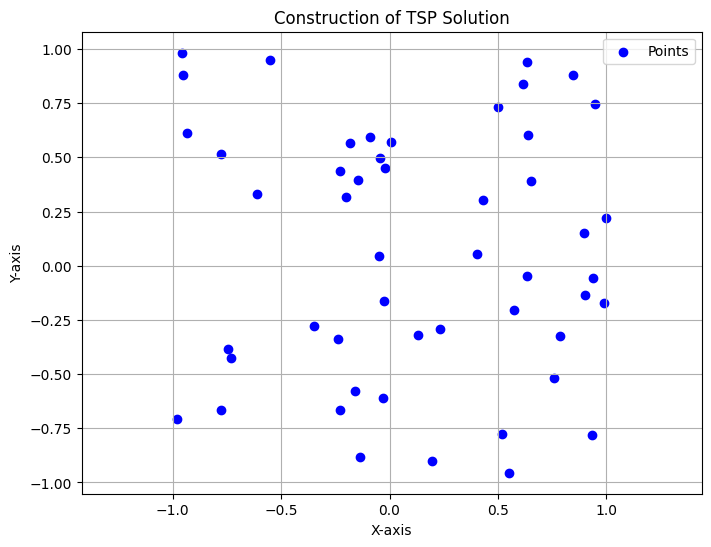

In [18]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Generate 20 random points in 2D plane
num_points = 50
x = np.random.uniform(-1, 1, size=num_points)
y = np.random.uniform(-1, 1, size=num_points)

# Sort points based on y-coordinate in descending order
sorted_indices = np.argsort(y)[::-1]
x = x[sorted_indices]
y = y[sorted_indices]

# Create distance matrix
points = np.column_stack((x, y))
distances = np.linalg.norm(points[:, np.newaxis] - points, axis=2)

# Nearest neighbor algorithm for TSP
def nearest_neighbor(distances):
    n = len(distances)
    visited = [False] * n
    tour = []
    current = 0
    visited[current] = True
    tour.append(current)
    for _ in range(n - 1):
        next_city = np.argmin(distances[current] + np.array(visited) * 1e9)  # Use a large number instead of np.inf
        visited[next_city] = True
        tour.append(next_city)
        current = next_city
    # Connect back to the starting city to complete the tour
    tour.append(tour[0])
    return tour

# Create a function to animate the construction of the TSP solution
def animate(frame):
    plt.clf()
    plt.scatter(x, y, color='blue', label='Points')
    plt.title('Construction of TSP Solution')
    plt.xlabel('X-axis')
    plt.ylabel('Y-axis')

    # Plot the current tour up to the current frame
    for i in range(frame):
        start = tour[i]
        end = tour[i + 1]
        plt.plot([x[start], x[end]], [y[start], y[end]], color='red')

    plt.axis('equal')
    plt.grid(True)
    plt.legend()

# Nearest neighbor algorithm to find TSP solution
tour = nearest_neighbor(distances)

# Create animation
fig = plt.figure(figsize=(8, 6))
ani = FuncAnimation(fig, animate, frames=len(tour)-1, repeat=False)

# Display animation in Colab
HTML(ani.to_jshtml())


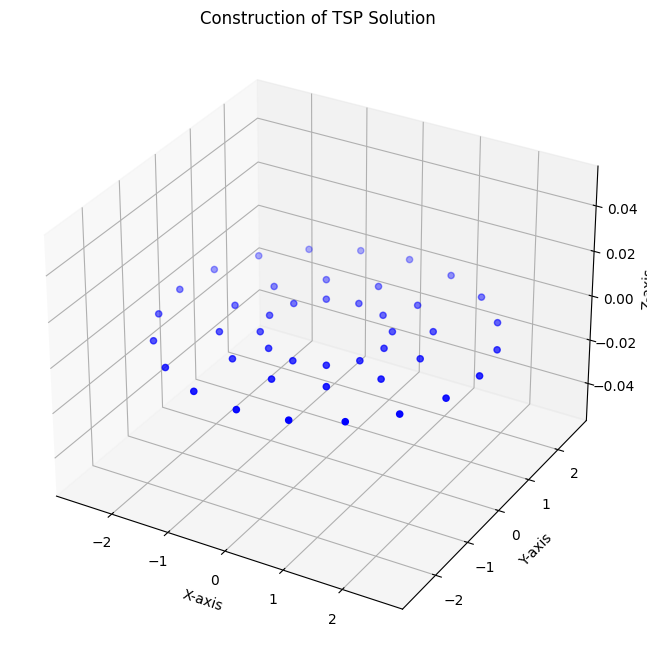

In [20]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Golden ratio
phi = (1 + np.sqrt(5)) / 2

# Generate vertices of a Rhombicosidodecahedron
vertices = []
for i in range(12):
    theta = i * (2 * np.pi) / 12
    x = np.cos(theta)
    y = np.sin(theta)
    vertices.append((x, y, 0))
    vertices.append((x * phi, y * phi, 0))

for i in range(20):
    theta = i * (2 * np.pi) / 20
    x = np.cos(theta)
    y = np.sin(theta)
    vertices.append((x * phi**2, y * phi**2, 0))

# Convert vertices to numpy array
vertices = np.array(vertices)

# Calculate distances between points
distances = np.linalg.norm(vertices[:, np.newaxis] - vertices, axis=2)

# Nearest neighbor algorithm for TSP
def nearest_neighbor(distances):
    n = len(distances)
    visited = [False] * n
    tour = []
    current = 0
    visited[current] = True
    tour.append(current)
    for _ in range(n - 1):
        next_city = np.argmin(distances[current] + np.array(visited) * 1e9)  # Use a large number instead of np.inf
        visited[next_city] = True
        tour.append(next_city)
        current = next_city
    # Connect back to the starting city to complete the tour
    tour.append(tour[0])
    return tour

# Create a function to animate the construction of the TSP solution
def animate(frame):
    ax.clear()
    ax.scatter(vertices[:, 0], vertices[:, 1], vertices[:, 2], color='blue')
    ax.set_title('Construction of TSP Solution')
    ax.set_xlabel('X-axis')
    ax.set_ylabel('Y-axis')
    ax.set_zlabel('Z-axis')

    # Plot the current tour up to the current frame
    for i in range(frame):
        start = tour[i]
        end = tour[i + 1]
        ax.plot([vertices[start, 0], vertices[end, 0]], [vertices[start, 1], vertices[end, 1]], [vertices[start, 2], vertices[end, 2]], color='red')

    ax.grid(True)

# Nearest neighbor algorithm to find TSP solution
tour = nearest_neighbor(distances)

# Create animation
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')
ani = FuncAnimation(fig, animate, frames=len(tour)-1, repeat=False)

# Display animation in Colab
HTML(ani.to_jshtml())
